In [1]:
import os
from pathlib import Path

current_path = Path.cwd()
if str(current_path.name) == 'examples':
    os.chdir(current_path.parent)
print(Path.cwd())

/hkfs/home/haicore/hgf_hmgu/hgf_sfs7789/git/group-cl


In [2]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import math
from groupcl.models import encoder
from groupcl.models import dynamics
from groupcl.models import groups
from groupcl import criterions
from groupcl import solver as solvers
from groupcl import datasets
from groupcl.datasets import synthetic
from groupcl.datasets.infinite_dsprites import ConfigurableInfiniteDSprites
from groupcl import loader
from groupcl.experiments import Experiment

In [3]:


dataset = synthetic.InfiniteDSpritesDataset(
    seed=17612,
    num_samples=300_000,
    dsprites=ConfigurableInfiniteDSprites(
        seed=74607,
        num_shapes=3,
        num_scales=6,
        num_orientations=40,
        num_position_x=32,
        num_position_y=32,
        img_size=64,
        _device='cpu',
    ),
    action_sampler=synthetic.DSpritesActionSampler(group_combinations=
        [
            ["orientation", "posX", "posY"],
        ]
    ),
    image_scale_range=[-1.0, 1.0],
    num_samples_per_action=532,
    _device='cpu',
    )

Loaded ConfigurableInfiniteDSprites from disk
Loaded InfiniteDSpritesDataset from disk


tensor(-1.) tensor(1.)
tensor([ 0, 27, 21, 18])
['scale', 'orientation', 'posX', 'posY']


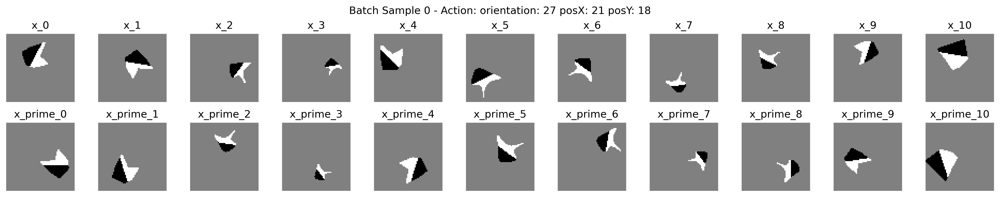

tensor([ 0, 33, 22, 22])
['scale', 'orientation', 'posX', 'posY']


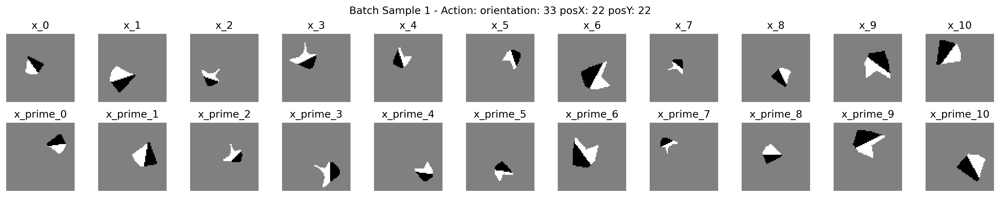

tensor([ 0, 26, 15, 15])
['scale', 'orientation', 'posX', 'posY']


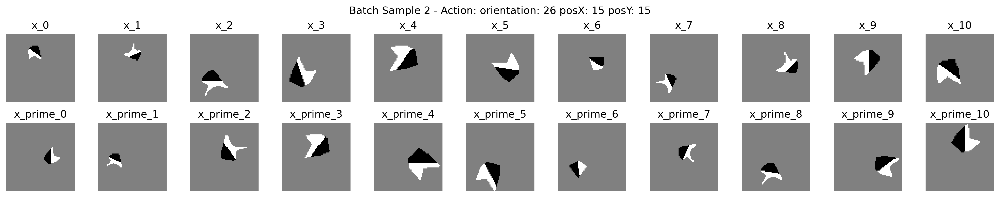

tensor([ 0, 28, 17, 14])
['scale', 'orientation', 'posX', 'posY']


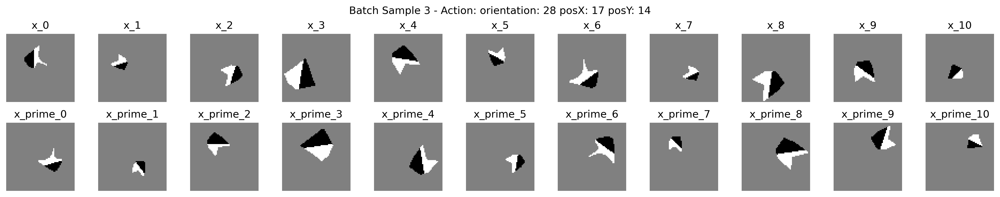

In [4]:
plot_loader = loader.GCLDataLoader(batch_size=4,
                                    samples_per_action=10,
                                    _device='cpu')
plot_loader.lazy_init(dataset)

import matplotlib.pyplot as plt

batch_data = next(iter(plot_loader))
batch_data.shape
print(batch_data.positives.x.min(), batch_data.positives.x.max())
_dataset = plot_loader.dataset
# Create one figure per batch dimension
for batch_idx in range(batch_data.positives.x.shape[0]):
    # Create a figure with two rows (x and x_prime) and samples_per_action+1 columns
    num_samples_per_action = batch_data.positives.x.shape[1]
    fig, axes = plt.subplots(2,
                             num_samples_per_action,
                             figsize=(1.5 * num_samples_per_action, 3),
                             dpi=300)

    # Set the figure title

    action_names = _dataset.action_sampler.action_names
    action_change = _dataset.action_sampler.action_idx_to_action(
        batch_data.positives.actions_idx[batch_idx][0])
    print(action_change)
    print(action_names)
    action_latents = list(zip(action_names, action_change.tolist()))
    detailed_title = " ".join([
        f"{latent}: {value}" for latent, value in action_latents if value != 0
    ])
    fig.suptitle(f'Batch Sample {batch_idx} - Action: {detailed_title}', y=1.05)

    for col_idx in range(batch_data.positives.x.shape[1]):
        axes[0,
             col_idx].imshow(batch_data.positives.x[batch_idx,
                                                    col_idx].view(64,
                                                                  64).numpy(),
                             cmap='gray')
        axes[0, col_idx].set_title(f'x_{col_idx}')
        axes[0, col_idx].axis('off')

    # Plot x_prime_images in the second row
    for col_idx in range(batch_data.positives.x_prime.shape[1]):
        axes[1, col_idx].imshow(batch_data.positives.x_prime[batch_idx,
                                                             col_idx].view(
                                                                 64,
                                                                 64).numpy(),
                                cmap='gray')
        axes[1, col_idx].set_title(f'x_prime_{col_idx}')
        axes[1, col_idx].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()


In [5]:
import torch

# Clear any existing variables that might be holding GPU memory
if 'train_loader' in locals():
    del train_loader
if 'val_loader' in locals():
    del val_loader
if 'test_loader' in locals():
    del test_loader
if 'experiment' in locals():
    del experiment
if 'solver' in locals():
    del solver
if 'model' in locals():
    del model
if 'loss' in locals():
    del loss

# Force garbage collection
import gc

gc.collect()
torch.cuda.empty_cache()


dynamics_dim=7
model_latent_dim = dynamics_dim + 2

num_epochs = 20
batch_size = 2**10
batch_size_neg = 2**12
samples_per_action_factor = 12
samples_per_action = dynamics_dim*samples_per_action_factor
negative_distribution = "both"


loss = criterions.SymmetricGCLLoss(
    group_model=groups.GroupDynamicsModel(
        system_solver=groups.LeastSquaresSolver(orthogonal_solution=False),
        dynamics_dim=dynamics_dim,
        no_grad_solve=True,
    ),
    criterion=criterions.MseInfoNCE(
        temperature=1.0,
        infonce_type="infonce_full_denominator",
    ),
)

model = encoder.MLP(
    seed=123,
    input_dim=dataset.observed_dim,
    output_dim=model_latent_dim,
    hidden_dim=512,
    num_layers=3,
    normalize=False,
)

solver = solvers.GCLSolver(
    seed=42,
    silence_metric_errors=True,
    num_epochs=num_epochs,
    optimizer=solvers.optim.AdamOptimizer(learning_rate=1e-3,),
    model=model,
    loss=loss,
)

train_loader=loader.DspritesInfiniteGCLDataLoader(
            num_iterations=1_000,
            shuffle=True,
            batch_size=batch_size,
            batch_size_neg=batch_size_neg,
            samples_per_action=samples_per_action,
            negative_distribution=negative_distribution,
        )
val_loader = loader.GCLDataLoader(
    shuffle=False,
    batch_size=2**9,
    batch_size_neg=2**9,
    samples_per_action=samples_per_action,
    negative_distribution=negative_distribution,
)

exp = Experiment(
    dataset=dataset,
    solver=solver,
    dataset_split=datasets.splits.StratifiedSystemsSplit(
        train_ratio=0.4,
        test_ratio=0.3,
    ),
    train_loader=train_loader,
    val_loader=val_loader,
    test_loader=val_loader.clone(),
)

Loaded ConfigurableInfiniteDSprites from disk
Loaded InfiniteDSpritesDataset from disk
Loaded ConfigurableInfiniteDSprites from disk
Loaded InfiniteDSpritesDataset from disk
Loaded ConfigurableInfiniteDSprites from disk
Loaded InfiniteDSpritesDataset from disk


In [6]:
exp.to_dict()

{'solver': {'model': {'seed': 123,
   'input_dim': 4096,
   'output_dim': 9,
   'normalize': False,
   'hidden_dim': 512,
   'num_layers': 3,
   'class_type': 'MLP'},
  'num_epochs': 20,
  'max_iterations': None,
  'seed': 42,
  'best_metric_key': None,
  'best_metric_mode': 'min',
  'version': '1',
  'optimizer': {'seed': 123,
   'learning_rate': 0.001,
   'beta1': 0.9,
   'beta2': 0.999,
   'eps': 1e-08,
   'weight_decay': 0.0,
   'class_type': 'AdamOptimizer'},
  'loss': {'group_model': {'no_grad_solve': True,
    'system_solver': {'orthogonal_solution': False,
     'class_type': 'LeastSquaresSolver'},
    'dynamics_dim': 7,
    'class_type': 'GroupDynamicsModel'},
   'criterion': {'temperature': 1.0,
    'infonce_type': 'infonce_full_denominator',
    'class_type': 'MseInfoNCE'},
   'class_type': 'SymmetricGCLLoss'},
  'class_type': 'GCLSolver'},
 'dataset': {'version': '1.0',
  'seed': 17612,
  'action_sampler': {'group_combinations': [['orientation', 'posX', 'posY']],
   'class_t

In [ ]:
from groupcl.metrics.identifiability import R2, VanillaR2
from groupcl.metrics.dynamics import LogisticRegressionClassification, NNActionAccuracy, NNActionPrediction


metrics = [
    LogisticRegressionClassification(group="x"),
    NNActionAccuracy(k=1, batch_size=8, max_samples=20_000),
    R2(group="x", true_subspace="shape"),
    R2(group="x", true_subspace="scale"),
    R2(group="x", true_subspace="orientation"),
    R2(group="x", true_subspace="posX"),
    R2(group="x", true_subspace="posY"),
]

In [8]:
exp.run(
    eval_frequency=2_000,
    disable_jaxtyping=True,
    eval_kwargs=dict(metrics=metrics),
)

Training on device: cuda
Training with random seed: 42


Training:   0%|          | 0/20000 [00:00<?, ?iter/s]

Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x
Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:02<00:00, 968.18it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1451.75it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1453.04it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1442.36it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1452.95it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1447.38it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1454.06it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1454.89it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1458.91it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1439.90it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1452.02it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1447.46it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1451.26it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1460.73it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1416.05it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:02<00:00, 1245.49it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1457.75it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1464.66it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1471.31it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1457.99it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias
Computing metric VanillaR2_X_PRIME_PRED_EMB
Computing metric LogisticRegressionClassification_x


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Computing metric NNActionAccuracy_top_1_n_20000


/home/hgf_hmgu/hgf_sfs7789/miniconda3/envs/groupcl/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [00:01<00:00, 1476.94it/s]


Computing metric R2_X_t[shape]_p[all]_Backward_bias
Computing metric R2_X_t[scale]_p[all]_Backward_bias
Computing metric R2_X_t[orientation]_p[all]_Backward_bias
Computing metric R2_X_t[posX]_p[all]_Backward_bias
Computing metric R2_X_t[posY]_p[all]_Backward_bias


In [12]:
list(exp.solver.logs.keys())

['epoch_start_time',
 'epoch_start_time_str',
 'train_loss_total',
 'train_loss_align',
 'train_loss_uniformity',
 'train_mse_x_prime_pred',
 'train_dot_x_prime_pred',
 'train_det_Q',
 'train_Q_minus_I_norm',
 'train_loss',
 'train_temperature',
 'train_epoch',
 'val_VanillaR2_X_PRIME_PRED_EMB',
 'val_LogisticRegressionClassification_x',
 'val_NNActionAccuracy_top_1_n_20000',
 'val_R2_X_t[shape]_p[all]_Backward_bias',
 'val_R2_X_t[scale]_p[all]_Backward_bias',
 'val_R2_X_t[orientation]_p[all]_Backward_bias',
 'val_R2_X_t[posX]_p[all]_Backward_bias',
 'val_R2_X_t[posY]_p[all]_Backward_bias',
 'val_loss_total',
 'val_loss_align',
 'val_loss_uniformity',
 'val_mse_x_prime_pred',
 'val_dot_x_prime_pred',
 'val_det_Q',
 'val_Q_minus_I_norm',
 'val_loss',
 'val_step',
 'val_epoch',
 'epoch_end_time',
 'epoch_end_time_str',
 'epoch_duration',
 'epoch_duration_str']

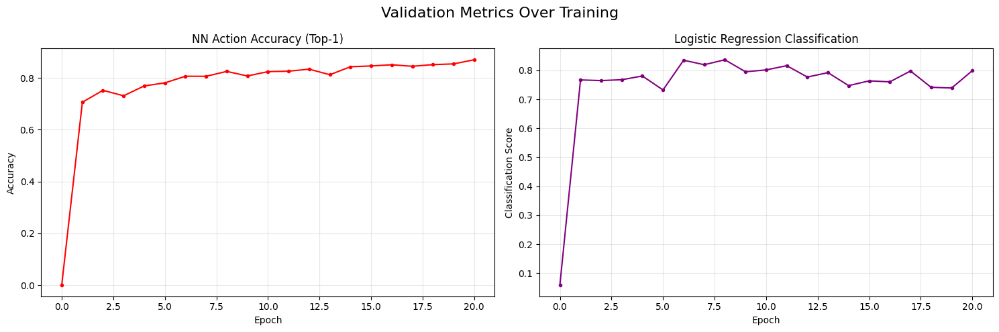

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Create subplots for different validation metrics
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Validation Metrics Over Training', fontsize=16)
epochs = exp.solver.logs['val_epoch']
epochs = [e + 1 for e in epochs]
epochs = [0] + epochs

# Plot NNActionAccuracy
ax1 = axes[0]
ax1.plot(epochs, exp.solver.logs['val_NNActionAccuracy_top_1_n_20000'],
         color='red', marker='o', markersize=3)
ax1.set_title('NN Action Accuracy (Top-1)')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.grid(True, alpha=0.3)

# Plot LogisticRegressionClassification
ax2 = axes[1]
ax2.plot(epochs, exp.solver.logs['val_LogisticRegressionClassification_x'],
         color='purple', marker='o', markersize=3)
ax2.set_title('Logistic Regression Classification')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Classification Score')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


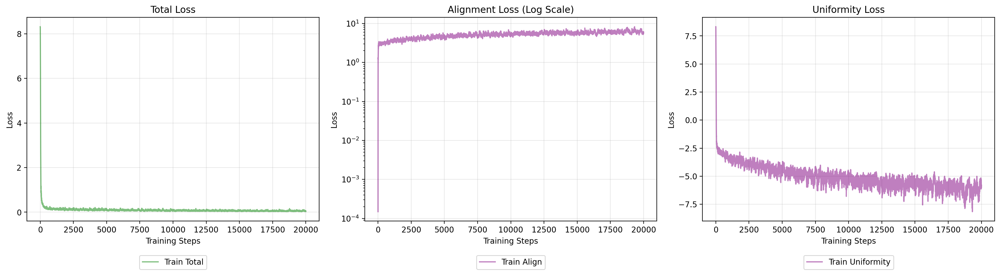

In [20]:
import matplotlib.pyplot as plt

# Configuration variables for styling
FIGSIZE = (18, 5)
TRAIN_COLOR = 'blue'
VAL_COLOR = 'blue'
CONTENT_COLOR = 'green'
GROUP_COLOR = 'red'
COMBINED_COLOR = 'purple'
MSE_COLOR = 'gray'

# Alpha and line style settings
TRAIN_ALPHA = 0.5
VAL_ALPHA = 0.9
TRAIN_STYLE = '-'
VAL_STYLE = '--'
TRAIN_WIDTH = 1.5
VAL_WIDTH = 2.5
GRID_ALPHA = 0.3
USE_LOG_SCALE = True  # Option to use log scale for y-axis

# Create a figure with 3 subplots for different loss types
fig, axes = plt.subplots(1, 3, figsize=FIGSIZE, sharey=False, dpi=200)
train_steps = range(len(exp.solver.logs.get('train_loss', [])))

# Define plot configurations for each subplot
subplot_configs = [
    # Subplot 1: Total Loss
    {
        'ax_idx':
            0,
        'title':
            'Total Loss',
        'log_scale':
            False,  # Normal scale for total loss
        'traces': [
            {
                'key': 'train_loss_total',
                'color': CONTENT_COLOR,
                'style': TRAIN_STYLE,
                'label': 'Train Total',
                'alpha': TRAIN_ALPHA,
                'linewidth': TRAIN_WIDTH
            },
        ]
    },
    # Subplot 2: Alignment Loss
    {
        'ax_idx':
            1,
        'title':
            'Alignment Loss (Log Scale)',
        'log_scale':
            True,  # Use log scale for alignment loss
        'traces': [
            {
                'key': 'train_loss_align',
                'color': COMBINED_COLOR,
                'style': TRAIN_STYLE,
                'label': 'Train Align',
                'alpha': TRAIN_ALPHA,
                'linewidth': TRAIN_WIDTH
            },
        ]
    },
    # Subplot 3: Uniformity Loss
    {
        'ax_idx':
            2,
        'title':
            'Uniformity Loss',
        'log_scale':
            False,  # Normal scale for uniformity loss
        'traces': [{
            'key': 'train_loss_uniformity',
            'color': COMBINED_COLOR,
            'style': TRAIN_STYLE,
            'label': 'Train Uniformity',
            'alpha': TRAIN_ALPHA,
            'linewidth': TRAIN_WIDTH
        },]
    }
]

# Generate each subplot
for config in subplot_configs:
    ax = axes[config['ax_idx']]

    # Add each trace if the key exists in logs
    for trace in config['traces']:
        if trace['key'] in exp.solver.logs:
            # Get the data
            y_data = exp.solver.logs[trace['key']]

            # Check if data is empty
            if len(y_data) == 0:
                print(f"Warning: {trace['key']} has no data")
                continue

            # Use train_steps for x data
            x_data = train_steps

            # Make sure x and y have the same length
            if len(x_data) != len(y_data):
                print(
                    f"Warning: {trace['key']} has different lengths for x ({len(x_data)}) and y ({len(y_data)})"
                )
                continue

            # Plot with specified parameters
            plot_kwargs = {
                'color': trace['color'],
                'linestyle': trace['style'],
                'label': trace['label'],
                'alpha': trace['alpha'],
                'linewidth': trace['linewidth']
            }

            ax.plot(x_data, y_data, **plot_kwargs)
        else:
            print(f"Warning: {trace['key']} not found in logs")
    # Set labels and styling
    ax.set_xlabel('Training Steps')
    ax.set_ylabel('Loss')
    ax.set_title(config['title'])
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
    ax.grid(True, alpha=GRID_ALPHA)

    # Apply log scale if specified for this subplot
    if USE_LOG_SCALE and config.get('log_scale', False):
        ax.set_yscale('log')

plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Make room for the baseline legend
plt.show()

In [37]:
from tqdm import tqdm

def compute_embeddings(dataset, solver):
    all_latents = dataset._latents
    all_images = dataset._shaped_imgs
    all_embeddings = []
    batch_size = 1024

    for i in tqdm(range(0, len(all_latents), batch_size)):
        batched_latents = all_latents[i:i + batch_size]
        batched_images = dataset.latent_to_img(batched_latents)
        embeddings = solver.embeddings(batched_images).detach().cpu()
        all_embeddings.append(embeddings)

    all_embeddings = torch.cat(all_embeddings, dim=0)
    print(all_embeddings.shape)

    return (all_latents, all_images, all_embeddings)


(all_latents, all_images, all_embeddings) = compute_embeddings(exp.val_loader.dataset, exp.solver)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 720/720 [00:00<00:00, 758.82it/s]

torch.Size([737280, 9])


In [38]:
all_latents=all_latents.detach().cpu()
all_images=all_images.detach().cpu()
all_embeddings = all_embeddings.detach().cpu()


latent_names=dataset.latent_names
latent_sizes=dataset.latent_sizes.detach().cpu()
image_dim=dataset.image_dim

In [39]:
latent_sizes_dict = {
    name: size.item()
    for name, size in zip(latent_names, latent_sizes)
}
latent_sizes_dict

{'shape': 3, 'scale': 6, 'orientation': 40, 'posX': 32, 'posY': 32}

In [40]:
all_latents.device

device(type='cpu')

In [41]:
group_dim = exp.solver.loss.group_model.dynamics_dim
latent_dim = exp.solver.model.output_dim
content_dim = latent_dim - group_dim
solver_seed = exp.solver.seed
group_dim, content_dim, solver_seed

(7, 2, 42)

In [42]:
model_desc = 'EbC'
model_desc += " " + f"{group_dim}D group & {content_dim}D content embedding - seed={solver_seed}"
# model_desc += f"\n Acc(G, 1)={acc_score}"

In [43]:

import torch
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from sklearn.decomposition import PCA, FastICA


def filter_embeddings_by_factors(all_embeddings,
                                 all_latents,
                                 latent_names,
                                 latent_sizes_dict,
                                 shapes_to_show=[0],
                                 scales_to_show=[0],
                                 orientations_to_show=None,
                                 orientation_downsample=2,
                                 posx_to_show=None,
                                 posx_downsample=2,
                                 posy_to_show=None,
                                 posy_downsample=2):
    """
    Filter embeddings and latents based on specified factor values.
    
    Parameters:
    -----------
    all_embeddings : torch.Tensor
        Tensor of embeddings
    all_latents : torch.Tensor
        Tensor of latent factors
    latent_names : list
        Names of the latent factors
    latent_sizes_dict : dict
        Dictionary mapping latent names to their sizes
    shapes_to_show : list
        List of shape indices to include
    scales_to_show : list
        List of scale indices to include
    orientations_to_show : list or None
        List of orientation indices to include. If None, use orientation_downsample.
    orientation_downsample : int
        Downsampling factor for orientation values (used only if orientations_to_show is None)
    posx_to_show : list or None
        List of posX indices to include. If None, use posx_downsample.
    posx_downsample : int
        Downsampling factor for posX values (used only if posx_to_show is None)
    posy_to_show : list or None
        List of posY indices to include. If None, use posy_downsample.
    posy_downsample : int
        Downsampling factor for posY values (used only if posy_to_show is None)
        
    Returns:
    --------
    tuple : (masked_embeddings, masked_gt_latents)
        Filtered embeddings and latents dictionary
    """
    # Create named latents dictionary
    named_gt_latents = {
        name: all_latents[:, i]
        for i, name in enumerate(latent_names)
    }

    # Create filter mask
    shape_mask = torch.ones_like(named_gt_latents["shape"], dtype=torch.bool)
    shape_mask &= torch.isin(named_gt_latents["shape"],
                             torch.tensor(shapes_to_show))
    shape_mask &= torch.isin(named_gt_latents["scale"],
                             torch.tensor(scales_to_show))

    # Handle orientation filtering
    if orientations_to_show is not None:
        shape_mask &= torch.isin(named_gt_latents["orientation"],
                                 torch.tensor(orientations_to_show))
    else:
        shape_mask &= torch.isin(
            named_gt_latents["orientation"],
            torch.linspace(0,
                           latent_sizes_dict["orientation"] - 1,
                           latent_sizes_dict["orientation"] //
                           orientation_downsample,
                           dtype=torch.int64))

    # Handle posX filtering
    if posx_to_show is not None:
        shape_mask &= torch.isin(named_gt_latents["posX"],
                                 torch.tensor(posx_to_show))
    else:
        shape_mask &= torch.isin(
            named_gt_latents["posX"],
            torch.linspace(0,
                           latent_sizes_dict["posX"] - 1,
                           latent_sizes_dict["posX"] // posx_downsample,
                           dtype=torch.int64))

    # Handle posY filtering
    if posy_to_show is not None:
        shape_mask &= torch.isin(named_gt_latents["posY"],
                                 torch.tensor(posy_to_show))
    else:
        shape_mask &= torch.isin(
            named_gt_latents["posY"],
            torch.linspace(0,
                           latent_sizes_dict["posY"] - 1,
                           latent_sizes_dict["posY"] // posy_downsample,
                           dtype=torch.int64))

    # Apply shape mask
    masked_embeddings = all_embeddings[shape_mask]
    masked_gt_latents = {
        name: latent[shape_mask]
        for name, latent in named_gt_latents.items()
        if torch.unique(latent[shape_mask]).numel() > 1
    }

    return masked_embeddings, masked_gt_latents


def plot_embeddings_by_factors(all_embeddings,
                               all_latents,
                               latent_names,
                               latent_sizes_dict,
                               shapes_to_show=[0],
                               scales_to_show=[0],
                               orientations_to_show=None,
                               orientation_downsample=2,
                               posx_to_show=None,
                               posx_downsample=2,
                               posy_to_show=None,
                               posy_downsample=2,
                               sample_size=10000,
                               figsize_per_col=4,
                               figsize_per_row=4,
                               colorbar_width_ratio=0.1,
                               max_emb_dim=10,
                               dpi=50,
                               point_size=5,
                               alpha=0.6,
                               cmap='magma',
                               axis_limit=None,
                               dim_subsample=None,
                               pca_dim=None,
                               ica_dim=None):
    """
    Plot embeddings colored by ground truth factors and viewed across dimensions.
    
    Parameters:
    -----------
    all_embeddings : torch.Tensor
        Tensor of embeddings
    all_latents : torch.Tensor
        Tensor of latent factors
    latent_names : list
        Names of the latent factors
    latent_sizes_dict : dict
        Dictionary mapping latent names to their sizes
    shapes_to_show : list
        List of shape indices to include in the plot
    scales_to_show : list
        List of scale indices to include in the plot
    orientations_to_show : list or None
        List of orientation indices to include in the plot. If None, use orientation_downsample.
    orientation_downsample : int
        Downsampling factor for orientation values (used only if orientations_to_show is None)
    posx_to_show : list or None
        List of posX indices to include in the plot. If None, use posx_downsample.
    posx_downsample : int
        Downsampling factor for posX values (used only if posx_to_show is None)
    posy_to_show : list or None
        List of posY indices to include in the plot. If None, use posy_downsample.
    posy_downsample : int
        Downsampling factor for posY values (used only if posy_to_show is None)
    sample_size : int
        Maximum number of points to sample for plotting
    figsize_per_col : float
        Figure width per column
    figsize_per_row : float
        Figure height per row
    colorbar_width_ratio : float
        Width ratio of colorbar to view
    dpi : int
        DPI for the figure
    point_size : int
        Size of scatter points
    alpha : float
        Transparency of scatter points
    cmap : str
        Colormap for scatter plots
    axis_limit : float or None
        Limit for axes if specified
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The created figure
    """
    # Filter embeddings and latents
    masked_embeddings, masked_gt_latents = filter_embeddings_by_factors(
        all_embeddings,
        all_latents,
        latent_names,
        latent_sizes_dict,
        shapes_to_show=shapes_to_show,
        scales_to_show=scales_to_show,
        orientations_to_show=orientations_to_show,
        orientation_downsample=orientation_downsample,
        posx_to_show=posx_to_show,
        posx_downsample=posx_downsample,
        posy_to_show=posy_to_show,
        posy_downsample=posy_downsample)

    print(f"masked_embeddings.shape: {masked_embeddings.shape}")
    print(f"masked_gt_latents.keys(): {masked_gt_latents.keys()}")

    if dim_subsample is None:
        emb_dim = min(all_embeddings.shape[-1], max_emb_dim)
        emb_dim_axis = list(range(emb_dim))
    else:
        assert isinstance(dim_subsample, list) and isinstance(
            dim_subsample[0], int)
        # downsample the dimensions
        masked_embeddings = masked_embeddings[..., dim_subsample]
        emb_dim = len(dim_subsample)
        emb_dim_axis = list(range(emb_dim))

    if pca_dim is not None:
        assert ica_dim is None, "Cannot perform both PCA and ICA"
        # Perform PCA on the embeddings
        pca = PCA(n_components=pca_dim)
        masked_embeddings = pca.fit_transform(masked_embeddings)
        emb_dim = pca_dim
        emb_dim_axis = list(range(emb_dim))

    if ica_dim is not None:
        assert pca_dim is None, "Cannot perform both PCA and ICA"
        # Perform ICA on the embeddings
        ica = FastICA(n_components=ica_dim)
        masked_embeddings = ica.fit_transform(masked_embeddings)
        emb_dim = ica_dim
        emb_dim_axis = list(range(emb_dim))

    # Determine grid dimensions
    num_rows = len(masked_gt_latents)
    num_view_cols = emb_dim
    num_cols = num_view_cols + 1  # Add one column for the colorbar

    # Calculate figure size
    fig_width = figsize_per_col * num_view_cols + figsize_per_col * colorbar_width_ratio
    fig_height = figsize_per_row * num_rows

    # Sample indices from the masked data
    num_masked_points = masked_embeddings.shape[0]
    sample_indices = np.random.choice(num_masked_points,
                                      min(sample_size, num_masked_points),
                                      replace=False)

    sampled_embeddings = masked_embeddings[sample_indices]

    # Create the figure and grid
    fig = plt.figure(figsize=(fig_width, fig_height),
                     dpi=dpi,
                     layout='constrained')
    gs = gridspec.GridSpec(num_rows,
                           num_cols,
                           figure=fig,
                           width_ratios=[1] * num_view_cols +
                           [colorbar_width_ratio])

    # Function to plot a single scatter plot on an axis
    def plot_single_embedding_view(ax, data, color_data, axis_dims, axis_limit,
                                   title, alpha, point_size, cmap, color_name):
        """Helper function to plot a single scatter view."""
        # Ensure axis_dims is a list or tuple
        axis_dims = list(axis_dims)
        is_3d = hasattr(ax, 'set_zlabel') and len(axis_dims) >= 3

        if is_3d:
            scatter = ax.scatter(data[:, axis_dims[0]],
                                 data[:, axis_dims[1]],
                                 data[:, axis_dims[2]],
                                 c=color_data,
                                 cmap=cmap,
                                 alpha=alpha,
                                 s=point_size)
            ax.set_zlabel(f'dim {axis_dims[2]}')
        else:
            scatter = ax.scatter(data[:, axis_dims[0]],
                                 data[:, axis_dims[1]],
                                 c=color_data,
                                 cmap=cmap,
                                 alpha=alpha,
                                 s=point_size)

        ax.set_xlabel(f'dim {axis_dims[0]}')
        ax.set_ylabel(f'dim {axis_dims[1]}')

        if axis_limit is not None:
            ax.set_xlim(-axis_limit, axis_limit)
            ax.set_ylim(-axis_limit, axis_limit)
            if is_3d:
                ax.set_zlim(-axis_limit, axis_limit)

        ax.set_title(title)
        return scatter

    # Iterate through ground truth factors (rows)
    for row_idx, (name, gt_latent) in enumerate(masked_gt_latents.items()):
        sampled_gt_latent = gt_latent[sample_indices]

        # Iterate through embedding dimension views (columns)
        for col_idx in range(num_view_cols):
            # Calculate axis dimensions for this view
            rolled_emb_dim_axis = np.roll(np.array(emb_dim_axis), -col_idx)
            axes = rolled_emb_dim_axis[:3].tolist()

            # Get the subplot axis
            ax = fig.add_subplot(gs[row_idx, col_idx],
                                 projection='3d' if len(axes) >= 3 else None)

            # Plot the data
            if dim_subsample is None:
                title = f'{name} ({axes})'
            else:
                title = f'{name} ({[dim_subsample[i] for i in axes]})'
            scatter = plot_single_embedding_view(
                ax,
                sampled_embeddings,
                sampled_gt_latent,
                axes,
                axis_limit,
                title,
                alpha,
                point_size,
                cmap,
                name.upper()  # color_name is used for colorbar label
            )

            # Add row title (ground truth factor name) to the first column's y-label
            if col_idx == 0:
                ax.set_ylabel(f'Colored by\n{name.upper()}',
                              rotation=0,
                              ha='right',
                              va='center',
                              labelpad=40)

        # Add colorbar for the current row (ground truth factor)
        ax_cbar = fig.add_subplot(gs[row_idx, num_view_cols])
        cbar = fig.colorbar(scatter, cax=ax_cbar)
        cbar.set_label(name.upper())

    return fig


masked_embeddings.shape: torch.Size([32, 9])
masked_gt_latents.keys(): dict_keys(['posY'])
masked_embeddings.shape: torch.Size([32, 9])
masked_gt_latents.keys(): dict_keys(['posX'])
masked_embeddings.shape: torch.Size([40, 9])
masked_gt_latents.keys(): dict_keys(['orientation'])
masked_embeddings.shape: torch.Size([1024, 9])
masked_gt_latents.keys(): dict_keys(['posX', 'posY'])
masked_embeddings.shape: torch.Size([1280, 9])
masked_gt_latents.keys(): dict_keys(['orientation', 'posX'])


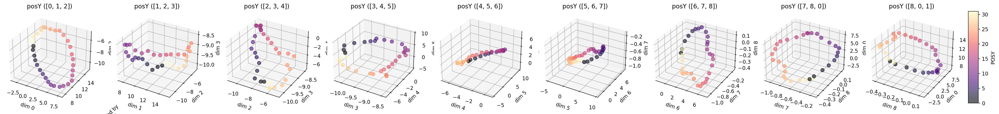

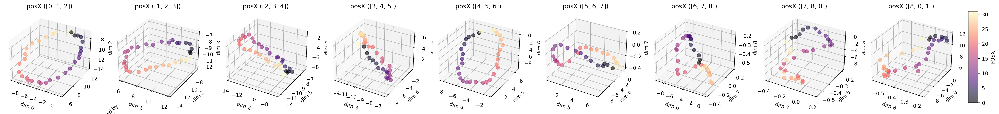

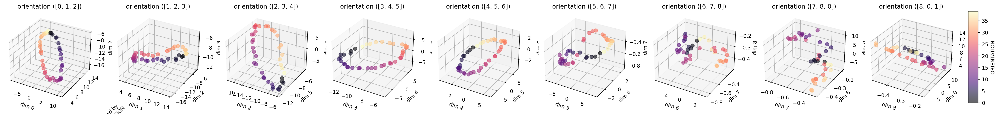

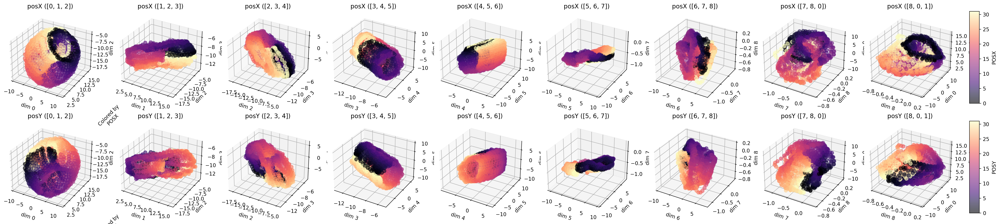

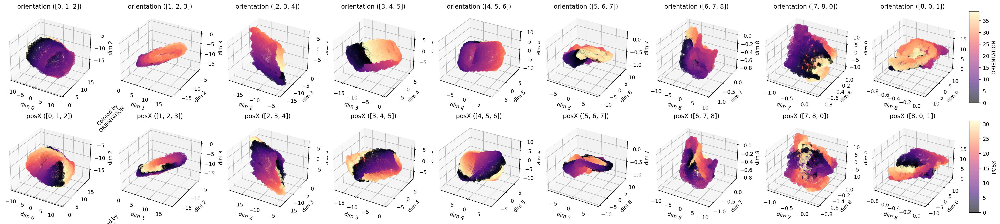

In [46]:
factor_kwargs = [
    dict(
        orientations_to_show=[0],
        posx_to_show=[0],
        posy_downsample=1,
    ),
    dict(
        orientations_to_show=[0],
        posy_to_show=[0],
        posx_downsample=1,
    ),
    dict(
        orientation_downsample=1,
        posy_to_show=[0],
        posx_to_show=[0],
    ),
    dict(
        orientations_to_show=[0],
        posx_downsample=1,
        posy_downsample=1,
    ),
    dict(
        posy_to_show=[0],
        posx_downsample=1,
        orientation_downsample=1,
    ),
]

for f_kwargs in factor_kwargs:
    fig = plot_embeddings_by_factors(
        # dim_subsample=[0,2,3,4,0],
        # pca_dim=4,
        # ica_dim=9,
        all_embeddings=all_embeddings,
        all_latents=all_latents,
        latent_names=latent_names,
        latent_sizes_dict=latent_sizes_dict,
        # max_emb_dim=dynamics_dim,
        max_emb_dim=latent_dim,
        dpi=200,
        point_size=50,
        figsize_per_col=3,
        figsize_per_row=3,
        shapes_to_show=[
            0,
            # 1,
            # 2,
        ],
        scales_to_show=[
            0,
            # 1,
            # 2,
        ],  # Show first 3 scales
        **f_kwargs,
    )
    fig.show()


3


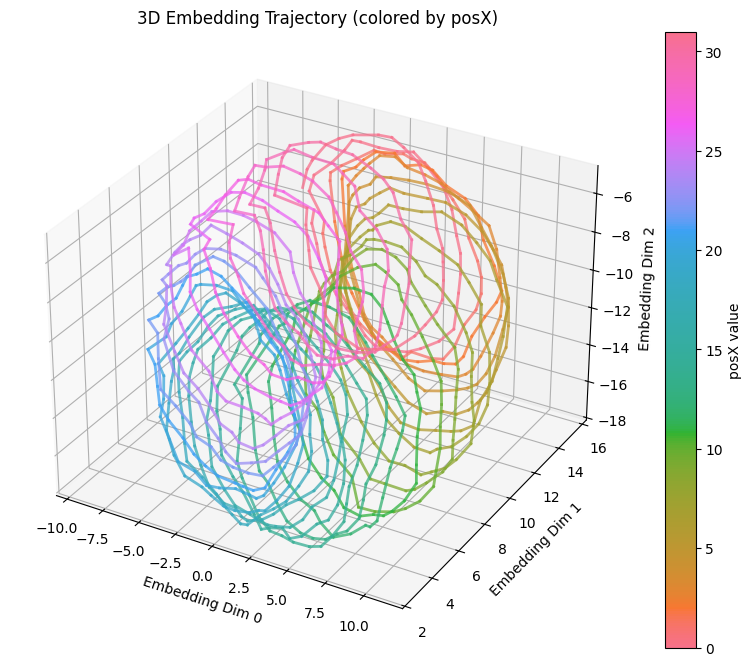

In [49]:
all_latents_shaped = all_latents.reshape(*list(latent_sizes_dict.values()), -1)
all_embeddings_shaped = all_embeddings.reshape(*list(latent_sizes_dict.values()), -1)
all_latents_shaped.shape, all_embeddings_shaped.shape

shape_idx = 0
scale_idx = 0
orientation_idx = 0
posx_idx = slice(0, latent_sizes_dict["posX"])
# posx_idx = 0
posy_idx = slice(0, latent_sizes_dict["posY"])

colorby_idx = latent_names.index("posX") 
print(colorby_idx)
all_embeddings_masked = all_embeddings_shaped[shape_idx, scale_idx,
                                              orientation_idx, posx_idx,
                                              posy_idx]
all_latents_masked = all_latents_shaped[shape_idx, scale_idx, orientation_idx,
                                        posx_idx, posy_idx]

colorby_data = all_latents_masked[..., colorby_idx]

all_embeddings_masked.shape, colorby_data.shape

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

dim_idx = (0,1,2)

all_embeddings_masked_flattened = all_embeddings_masked.reshape(
    -1, all_embeddings_masked.shape[-1])
colorby_data_flattened = colorby_data.reshape(-1)

# Use first 3 dimensions for the 3D plot
x = all_embeddings_masked_flattened[:, dim_idx[0]]
y = all_embeddings_masked_flattened[:, dim_idx[1]]
z = all_embeddings_masked_flattened[:, dim_idx[2]]

# Create the 3D line plot with each segment colored by colorby_data
import matplotlib.cm as cm
import numpy as np

# Normalize colorby_data for colormap
norm = plt.Normalize(vmin=colorby_data.min(), vmax=colorby_data.max())
cmap = sns.husl_palette(as_cmap=True)

# Plot each line segment with its own color
for i in range(len(x) - 1):
    color = cmap(norm(colorby_data_flattened[i]))
    ax.plot([x[i], x[i+1]], [y[i], y[i+1]], [z[i], z[i+1]],
            color=color, linewidth=2, alpha=0.75)

# Create a dummy scatter plot for the colorbar
scatter = ax.scatter([], [], [], c=[], cmap=cmap, vmin=colorby_data.min(), vmax=colorby_data.max())

ax.set_xlabel('Embedding Dim 0')
ax.set_ylabel('Embedding Dim 1')
ax.set_zlabel('Embedding Dim 2')
ax.set_title('3D Embedding Trajectory (colored by posX)')

# Add colorbar
plt.colorbar(scatter, ax=ax, label='posX value')
plt.show()


varying_latents: ['posX', 'posY']
varying_latents: ['posX', 'posY']


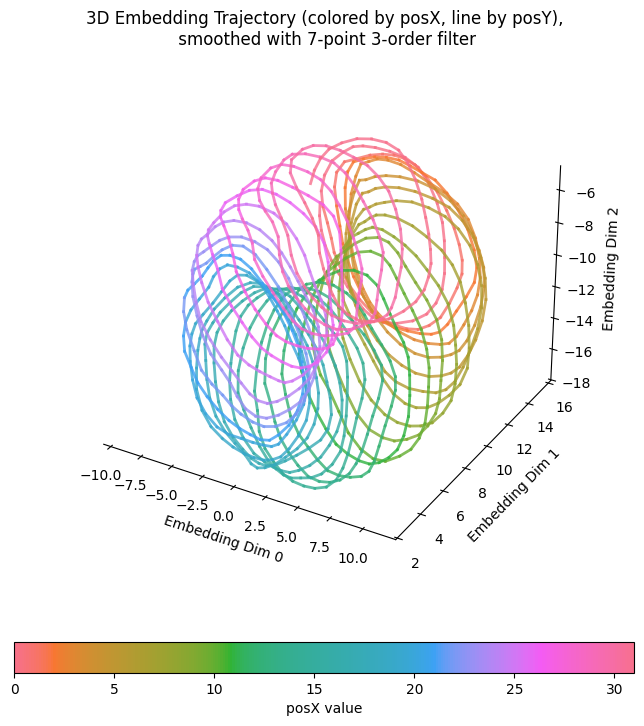

varying_latents: ['posX', 'posY']
varying_latents: ['posX', 'posY']


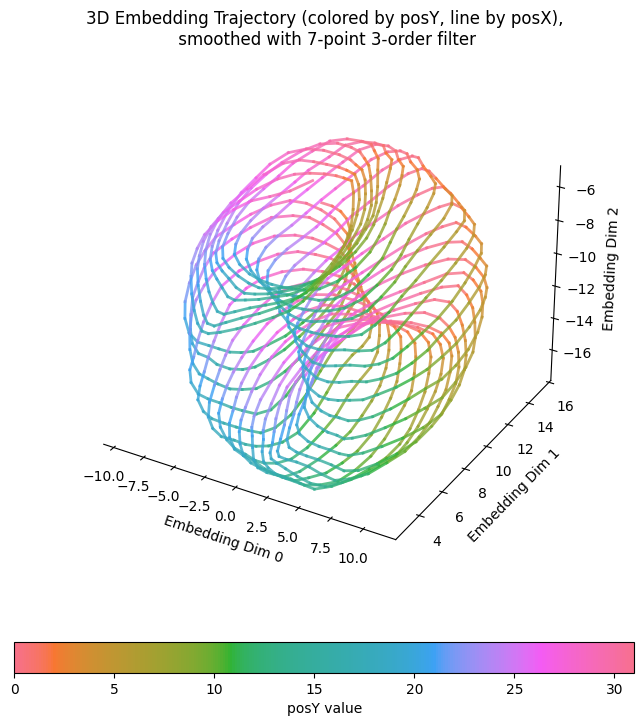

varying_latents: ['posX', 'posY']
varying_latents: ['posX', 'posY']


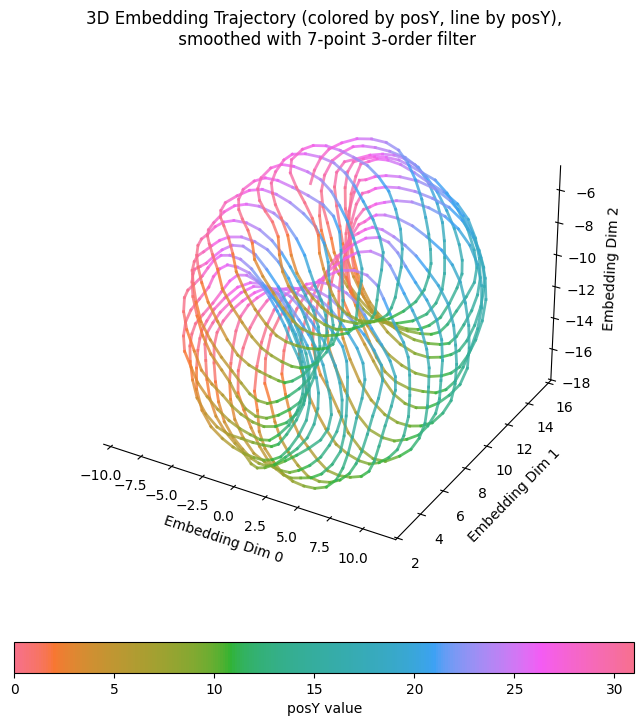

varying_latents: ['posX', 'posY']
varying_latents: ['posX', 'posY']


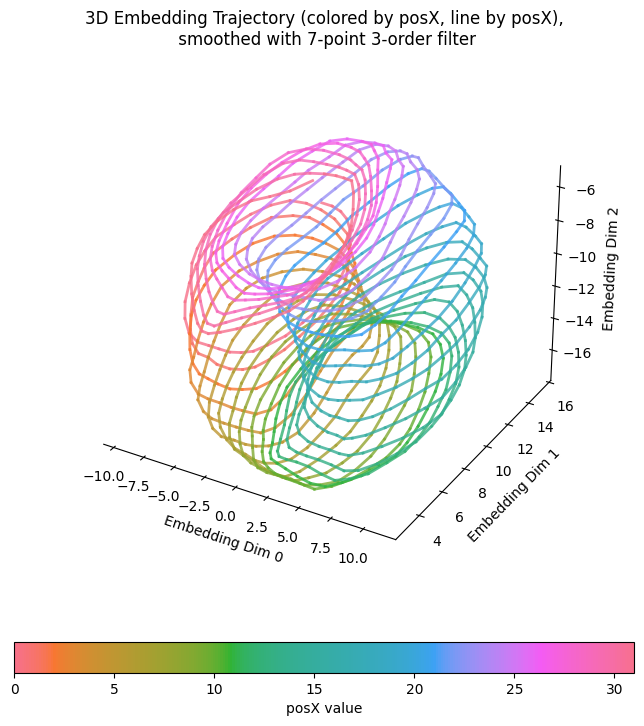

In [55]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from scipy.signal import savgol_filter


smoothing_filter = dict(window_length=7, polyorder=3)
# smoothing_filter = None

for col_idx, (varying_latents, colorby,
              line_by) in enumerate([(["posX", "posY"], "posX", "posY"),
                                     (["posX", "posY"], "posY", "posX"),
                                     (["posX", "posY"], "posY", "posY"),
                                     (["posX", "posY"], "posX", "posX")]):
    print("varying_latents:", varying_latents)
    # sort by index of latent_names
    varying_latents = sorted(varying_latents,
                             key=lambda x: latent_names.index(x))
    print("varying_latents:", varying_latents)

    colorby_idx = latent_names.index(colorby)
    line_by_idx = varying_latents.index(line_by)

    shape_idx = slice(
        0, latent_sizes_dict["shape"]) if "shape" in varying_latents else 0
    scale_idx = slice(
        0, latent_sizes_dict["scale"]) if "scale" in varying_latents else 0
    orientation_idx = slice(0, latent_sizes_dict["orientation"]
                            ) if "orientation" in varying_latents else 0
    posx_idx = slice(
        0, latent_sizes_dict["posX"]) if "posX" in varying_latents else 0
    posy_idx = slice(
        0, latent_sizes_dict["posY"]) if "posY" in varying_latents else 0


    all_embeddings_masked = all_embeddings_shaped[shape_idx, scale_idx,
                                                  orientation_idx, posx_idx,
                                                  posy_idx]
    all_latents_masked = all_latents_shaped[shape_idx, scale_idx,
                                            orientation_idx, posx_idx,
                                            posy_idx]

    colorby_data = all_latents_masked[..., colorby_idx]

    all_embeddings_masked.shape, colorby_data.shape

    factor=1.0
    fig = plt.figure(figsize=(8*factor, 9*factor), dpi=100 / factor)
    ax = fig.add_subplot(111, projection='3d')

    dim_idx = (0,1,2)

    if line_by_idx == 1:
        all_embeddings_masked_flattened = all_embeddings_masked.reshape(
            -1, all_embeddings_masked.shape[-1])
    else:
        all_embeddings_masked_flattened = all_embeddings_masked.swapaxes(
            0, 1).reshape(-1, all_embeddings_masked.shape[-1])

    colorby_data_flattened = colorby_data.reshape(-1)

    if smoothing_filter is not None:
        all_embeddings_filtered = np.zeros_like(
            all_embeddings_masked_flattened)
        for i in range(all_embeddings_masked_flattened.shape[1]):
            all_embeddings_filtered[:, i] = savgol_filter(
                all_embeddings_masked_flattened[:, i], **smoothing_filter)
    else:
        all_embeddings_filtered = all_embeddings_masked_flattened

    # Use first 3 dimensions for the 3D plot
    x = all_embeddings_filtered[:, dim_idx[0]]
    y = all_embeddings_filtered[:, dim_idx[1]]
    z = all_embeddings_filtered[:, dim_idx[2]]

    # Create the 3D line plot with each segment colored by colorby_data
    import matplotlib.cm as cm
    import numpy as np

    # Normalize colorby_data for colormap
    norm = plt.Normalize(vmin=colorby_data.min(), vmax=colorby_data.max())
    cmap = sns.husl_palette(as_cmap=True)

    # Plot each line segment with its own color
    for i in range(len(x) - 1):
        color = cmap(norm(colorby_data_flattened[i]))
        ax.plot(
            [x[i], x[i + 1]],
            [y[i], y[i + 1]],
            [z[i], z[i + 1]],
            color=color,
            linewidth=2,
            alpha=0.8,)

    # Create a dummy scatter plot for the colorbar
    scatter = ax.scatter([], [], [],
                         c=[],
                         cmap=cmap,
                         vmin=colorby_data.min(),
                         vmax=colorby_data.max())

    ax.set_xlabel('Embedding Dim 0')
    ax.set_ylabel('Embedding Dim 1')
    ax.set_zlabel('Embedding Dim 2')
    title = f'3D Embedding Trajectory (colored by {colorby}, line by {line_by})'
    if smoothing_filter is not None:
        title += f',\n smoothed with {smoothing_filter["window_length"]}-point {smoothing_filter["polyorder"]}-order filter'
    ax.set_title(title)
    # ax.view_init(elev=20, azim=35)
    # Add colorbar
    cbar = plt.colorbar(scatter,
                        ax=ax,
                        label=f'{colorby} value',
                        orientation='horizontal',
                        pad=0.1)
    # cbar.ax.set_position([0.15, 0.05, 0.7, 0.03])  # [left, bottom, width, height]

    # Remove the axes
    # ax.set_axis_off()

    # Remove the grid
    ax.grid(False)

    # Make the figure transparent
    fig = plt.gcf()
    fig.patch.set_alpha(0.0)
    ax.patch.set_alpha(0.0)

    # Make all panes of the 3D axis transparent
    ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

    # Make the axis lines transparent as well
    # ax.xaxis._axinfo["grid"]['color'] = (1, 1, 1, 0)
    # ax.yaxis._axinfo["grid"]['color'] = (1, 1, 1, 0)
    # ax.zaxis._axinfo["grid"]['color'] = (1, 1, 1, 0)

    # Set the background color to transparent
    fig.patch.set_facecolor('none')
    ax.set_facecolor('none')

    plt.show()


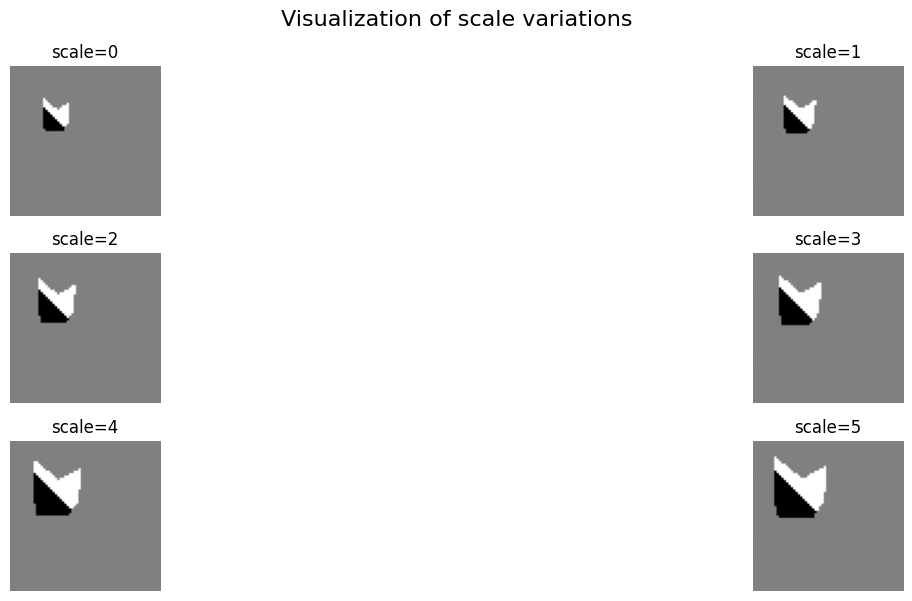

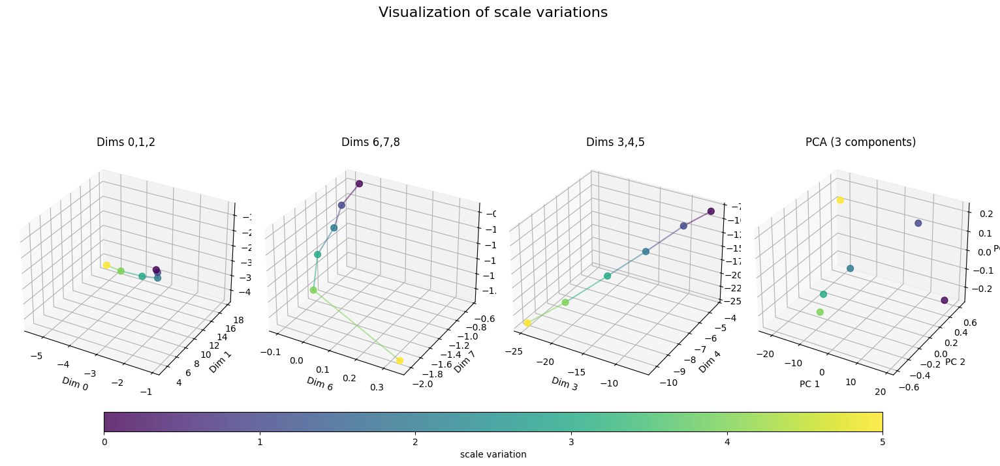

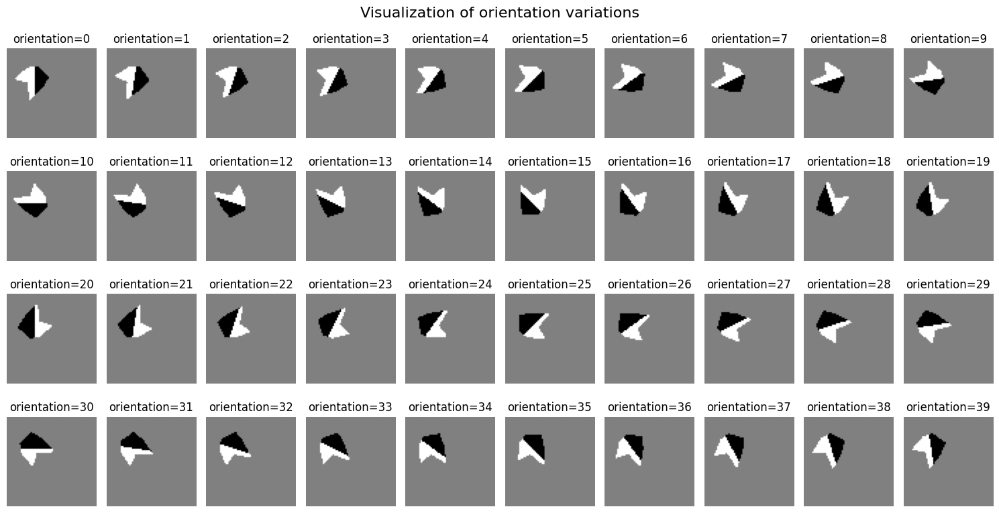

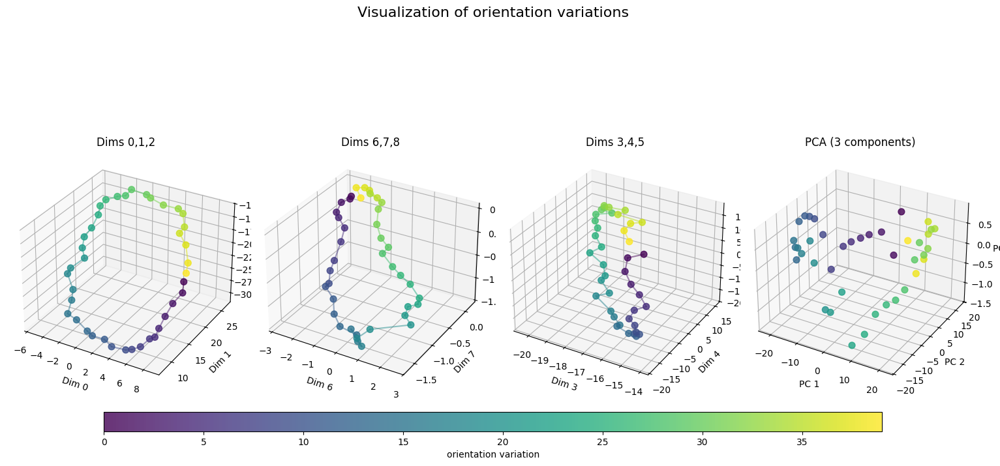

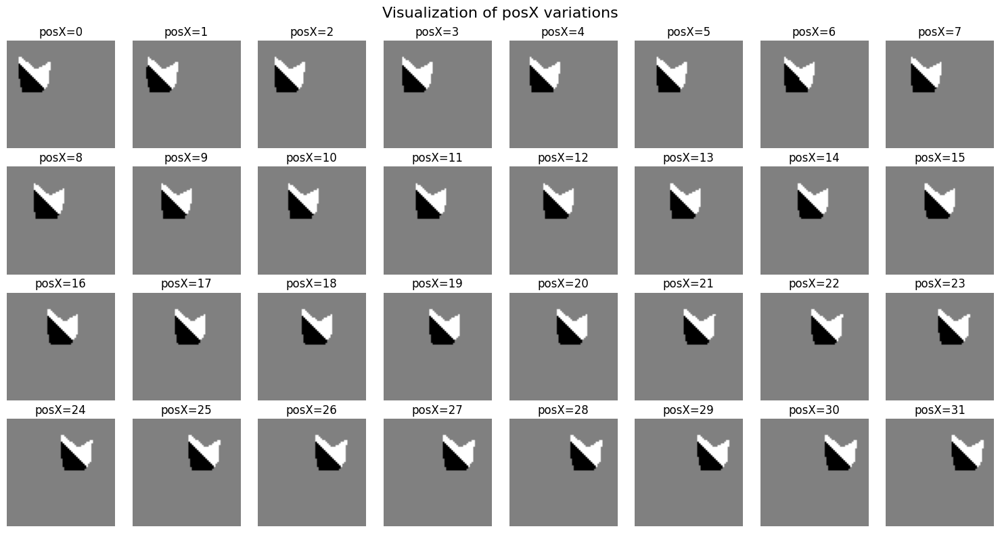

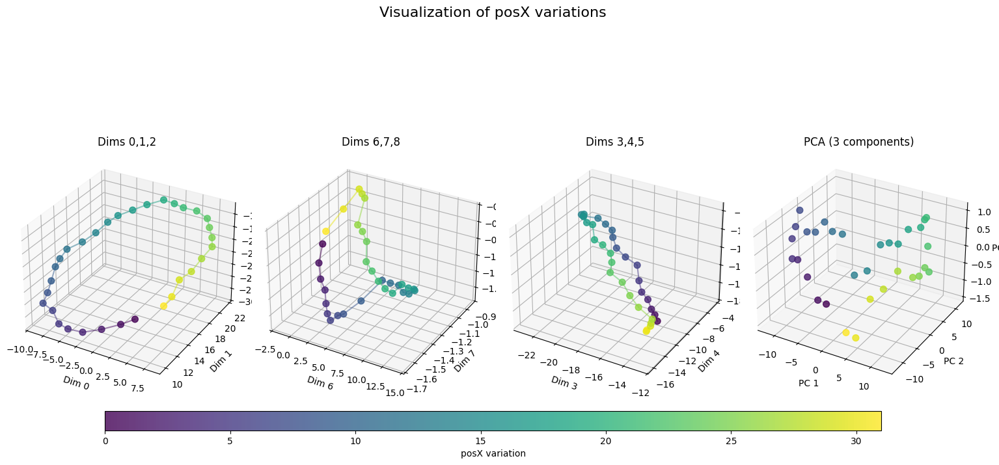

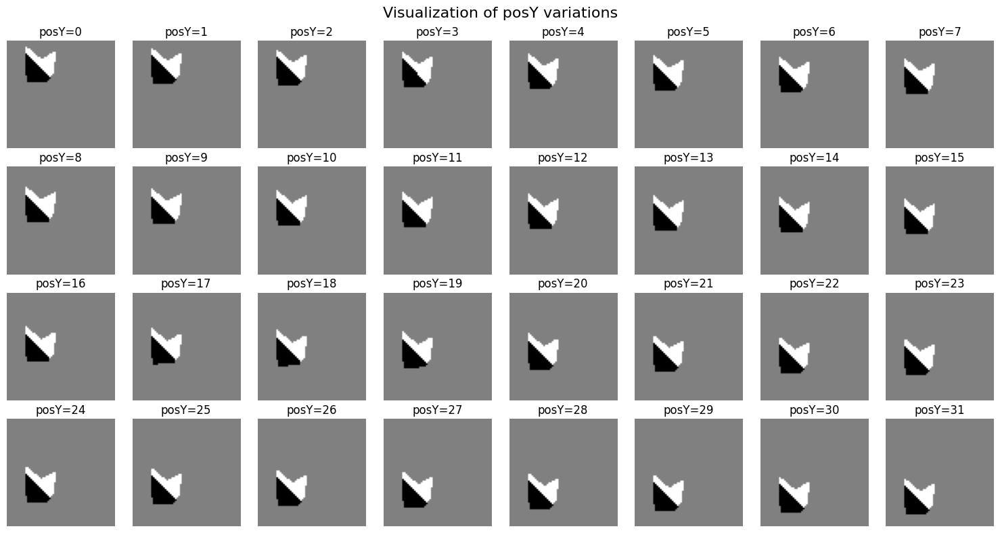

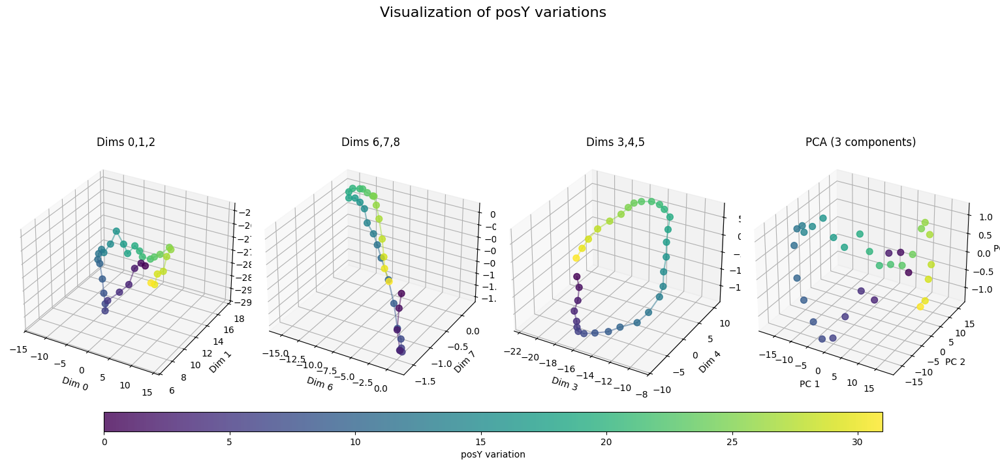

In [45]:

import matplotlib.pyplot as plt
# Create 3D scatter plots of the embeddings
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

val_dataset = exp.val_loader.dataset

val_dataset.latent_dim

val_dataset.latent_names, val_dataset.latent_sizes

for axis_name in val_dataset.latent_names:
    if axis_name == "shape":
        continue
    axis_id = val_dataset.latent_names.index(axis_name)
    axis_latent_size = val_dataset.latent_sizes[axis_id]

    axis_variations = torch.arange(start=0, end=axis_latent_size.item(), step=1)
    latent_update = torch.zeros((
        len(axis_variations),
        val_dataset.latent_dim,
    ))
    latent_update[:, axis_id] = axis_variations

    # set torch seed
    torch.manual_seed(42)
    latent_x = val_dataset._generate_starting_points(num_samples=1)
    latent_x[..., axis_id] = 0

    latent_x_prime = latent_x + latent_update.to(latent_x.device)
    latent_x_prime = torch.remainder(latent_x_prime, val_dataset.latent_sizes)
    latent_x_prime.shape

    obs_x = val_dataset.latent_to_img(latent_x)
    obs_x_prime = val_dataset.latent_to_img(latent_x_prime)

    obs_x.shape, obs_x_prime.shape

    # Reshape the images from flattened (4096) to 2D (64x64) for visualization
    obs_x_reshaped = obs_x.reshape(1, 64, 64)
    obs_x_prime_reshaped = obs_x_prime.reshape(len(axis_variations), 64, 64)

    # Create a figure to display all images
    plt.figure(figsize=(15, 8))

    # Define number of rows for visualization
    num_rows = 4  # You can adjust this variable as needed

    # Calculate number of columns based on rows and total images
    num_cols = int(np.ceil(len(axis_variations) / num_rows))

    # Plot all transformed images showing different orientations
    for i in range(len(axis_variations)):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(obs_x_prime_reshaped[i].cpu().numpy(), cmap='gray')
        plt.title(f"{axis_name}={i}")
        plt.axis('off')

    plt.suptitle(f"Visualization of {axis_name} variations", fontsize=16)
    plt.tight_layout()
    plt.show()

    # compute embeddings
    exp.solver.to(obs_x_prime.device)
    embeddings = exp.solver.embeddings(obs_x_prime)
    embeddings.shape

    # Convert embeddings to CPU and numpy for plotting
    embeddings_np = embeddings.detach().cpu().numpy()
    # Import PCA

    # Get embedding dimension
    emb_dim = embeddings_np.shape[1]
    emb_dim_axis = list(range(emb_dim))

    def create_3d_scatter(ax, data, dims, color_data, title):
        """Create a 3D scatter plot with the given dimensions"""
        scatter = ax.scatter(data[:, dims[0]],
                             data[:, dims[1]],
                             data[:, dims[2]],
                             c=color_data,
                             cmap='viridis',
                             s=50,
                             alpha=0.8)
        # Create a line plot with a loop to color the trace nicely
        for j in range(len(data) - 1):
            ax.plot(data[j:j + 2, dims[0]],
                    data[j:j + 2, dims[1]],
                    data[j:j + 2, dims[2]],
                    color=plt.cm.viridis(color_data[j] / max(color_data)),
                    alpha=0.5)
        ax.set_title(title)
        ax.set_xlabel(f'Dim {dims[0]}')
        ax.set_ylabel(f'Dim {dims[1]}')
        ax.set_zlabel(f'Dim {dims[2]}')
        return scatter

    # Create a figure with multiple 3D scatter plots
    fig = plt.figure(figsize=(15, 7), layout='constrained')
    # add title
    fig.suptitle(f"Visualization of {axis_name} variations", fontsize=16)

    rolls = list(range(0, emb_dim, 3))
    # Calculate how many 3D plots we need (one for PCA and the rest for raw dimensions)

    total_plots = len(rolls) + 1

    # Create plots for raw dimensions
    scatters = []
    for ax_i, i in enumerate(rolls):
        # Roll the dimensions to show all dimensions once
        rolled_emb_dim_axis = torch.roll(torch.tensor(emb_dim_axis), i)
        axes = rolled_emb_dim_axis[:3]
        ax = fig.add_subplot(1, total_plots, ax_i + 1, projection='3d')
        scatter = create_3d_scatter(
            ax=ax,
            data=embeddings_np,
            dims=axes,
            color_data=np.arange(len(embeddings_np)),
            title=f'Dims {axes[0]},{axes[1]},{axes[2]}',
        )
        scatters.append(scatter)

    # Create PCA plot
    pca = PCA(n_components=3)
    embeddings_pca = pca.fit_transform(embeddings_np)
    ax_pca = fig.add_subplot(1, total_plots, total_plots, projection='3d')
    scatter_pca = ax_pca.scatter(embeddings_pca[:, 0],
                                 embeddings_pca[:, 1],
                                 embeddings_pca[:, 2],
                                 c=np.arange(len(embeddings_np)),
                                 cmap='viridis',
                                 s=50,
                                 alpha=0.8)
    ax_pca.set_title('PCA (3 components)')
    ax_pca.set_xlabel('PC 1')
    ax_pca.set_ylabel('PC 2')
    ax_pca.set_zlabel('PC 3')
    scatters.append(scatter_pca)

    # Add a single colorbar below the subplots
    cbar = fig.colorbar(
        scatters[0],
        ax=fig.axes,
        orientation='horizontal',
        pad=0.05,  # Adjust padding to move the colorbar below the subplots
        shrink=0.8,
        label=f'{axis_name} variation',
        aspect=40)

    plt.show()


In [56]:
nn_predictor = NNActionPrediction(batch_size=1,
                                  epochs=1000,
                                  seed=0,
                                  action_names=[["posY"]])
# from groupcl.utils.jaxtyping import disable_jaxtyping
# with disable_jaxtyping():
(
    similarity_matrices,
    nn_action_predictions,
    true_actions,
    intermediate_results,
) = nn_predictor.nearest_neighbor_prediction(
    dataset=exp.val_loader.dataset.to("cuda"),
    solver=exp.solver.to("cuda"),
    samples_per_action=exp.val_loader.samples_per_action,
    return_intermediate_results=True,
)
similarity_matrices.shape, nn_action_predictions.shape, true_actions.shape, type(
    intermediate_results)

(torch.Size([1000, 32, 32]),
 torch.Size([1000, 32]),
 torch.Size([1000, 32]),
 dict)

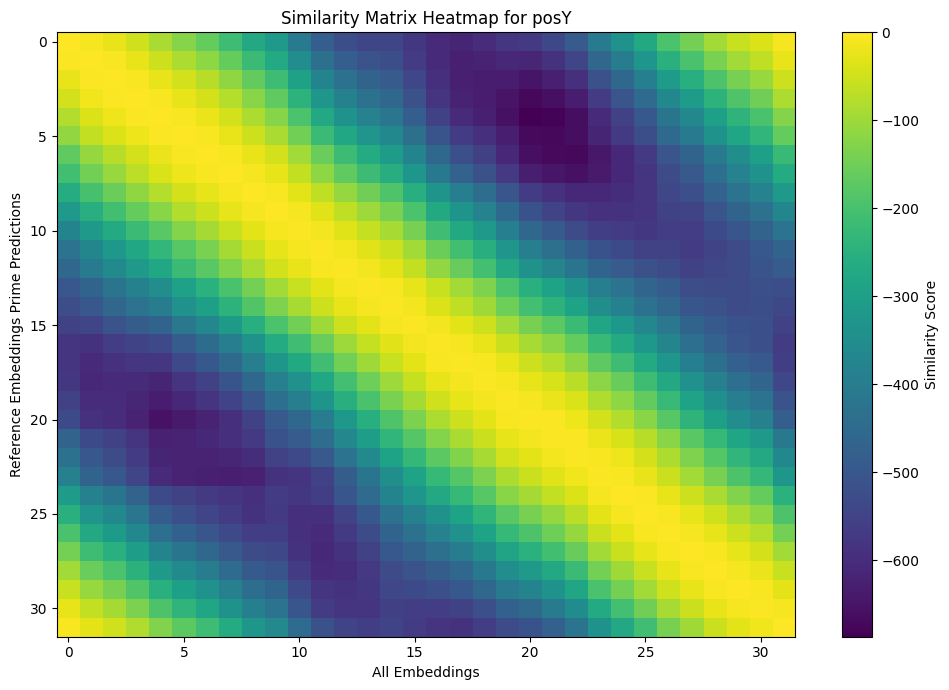

torch.Size([32, 32])

In [ ]:
# Plot the similarity matrix as a heatmap
from matplotlib import pyplot as plt

similarity_matrix = similarity_matrices.mean(dim=0)
plt.figure(figsize=(10, 7))
im = plt.imshow(similarity_matrix.detach().cpu().numpy(),
                cmap='viridis',
                interpolation='none',
                aspect='auto')
plt.title(
    f'Averaged Similarity Matrix Heatmap for {"+".join(nn_predictor.action_names[0])} over {len(similarity_matrices)} samples'
)
plt.xlabel('All Embeddings')
plt.ylabel('Reference Embeddings Prime Predictions')
plt.colorbar(im, label='Similarity Score')
plt.tight_layout()
plt.show()

# Return the similarity matrix
similarity_matrix.shape

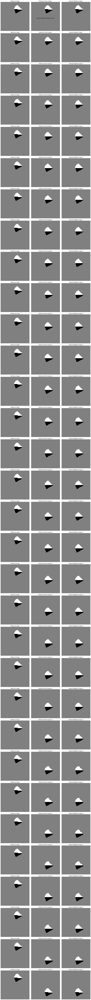

In [59]:
import numpy as np

val_dataset = exp.val_loader.dataset
reference_y = val_dataset.latent_to_img(intermediate_results["reference_x"][0])
reference_y_prime = val_dataset.latent_to_img(
    intermediate_results["reference_x_prime"][0])
nn_obs = val_dataset.latent_to_img(
    intermediate_results["nn_latent_predictions"][0])
nn_idx = nn_action_predictions[0] - 1

# Create a figure with grid layout to display the images
# Based on the error and shapes, we need to handle multiple images
num_images = nn_obs.shape[0]  # Get the number of images
img_size = int(np.sqrt(
    reference_y.shape[-1]))  # Calculate image size from flattened dimension

# Create a figure with rows for each image and 3 columns
fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
latent_name = nn_predictor.action_names[0][0]
fig.suptitle(f'Nearest Neighbor Images for {latent_name}')
# If there's only one image, make sure axes is still 2D
if num_images == 1:
    axes = axes.reshape(1, -1)

# Reshape and display each set of images
for i in range(num_images):
    # Reshape images from flattened vectors to square images
    reference_y_img = reference_y.view(1, img_size,
                                       img_size).detach().cpu().numpy()[0]
    reference_y_prime_img = reference_y_prime.view(
        num_images, img_size, img_size).detach().cpu().numpy()[i]
    nn_obs_img = nn_obs.view(num_images, img_size,
                             img_size).detach().cpu().numpy()[i]

    # Display the images in the grid
    axes[i, 0].imshow(reference_y_img, cmap='gray')
    axes[i, 0].set_title(f'Reference Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(reference_y_prime_img, cmap='gray')
    axes[i, 1].set_title(f'Reference Prime Image {i+1}')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(nn_obs_img, cmap='gray')
    axes[i, 2].set_title(f'Nearest Neighbor Image {nn_idx[i]+1}')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


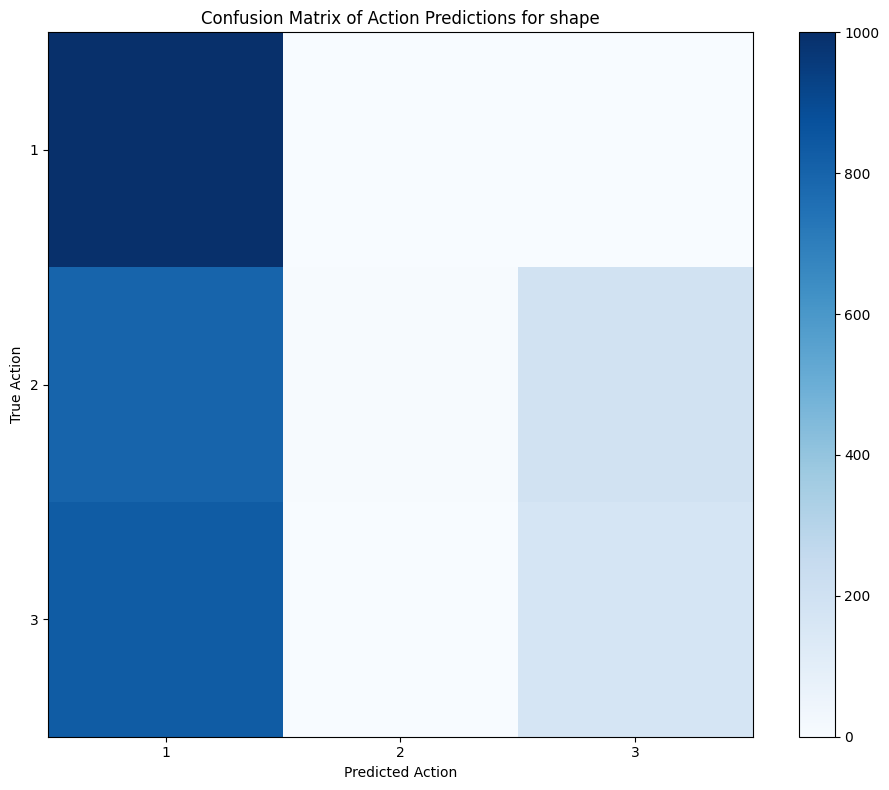

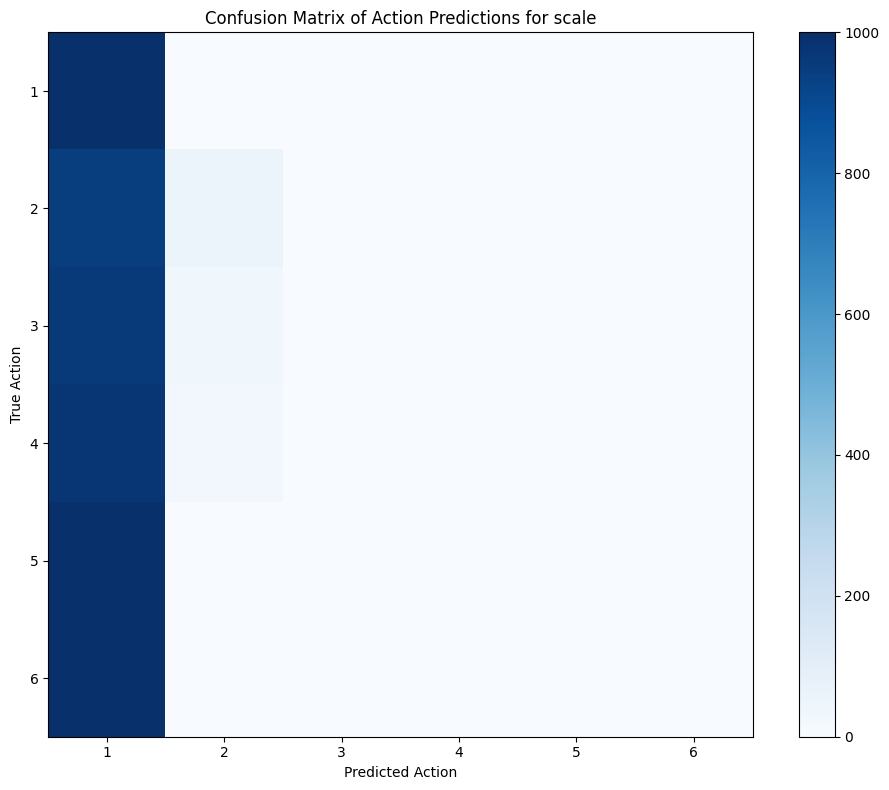

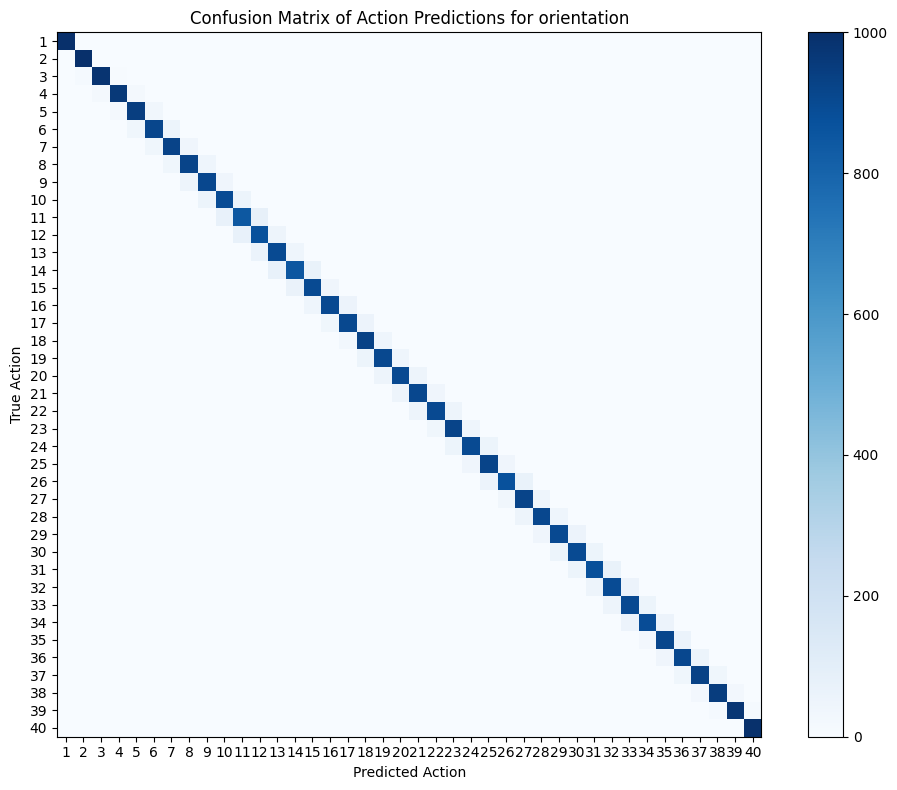

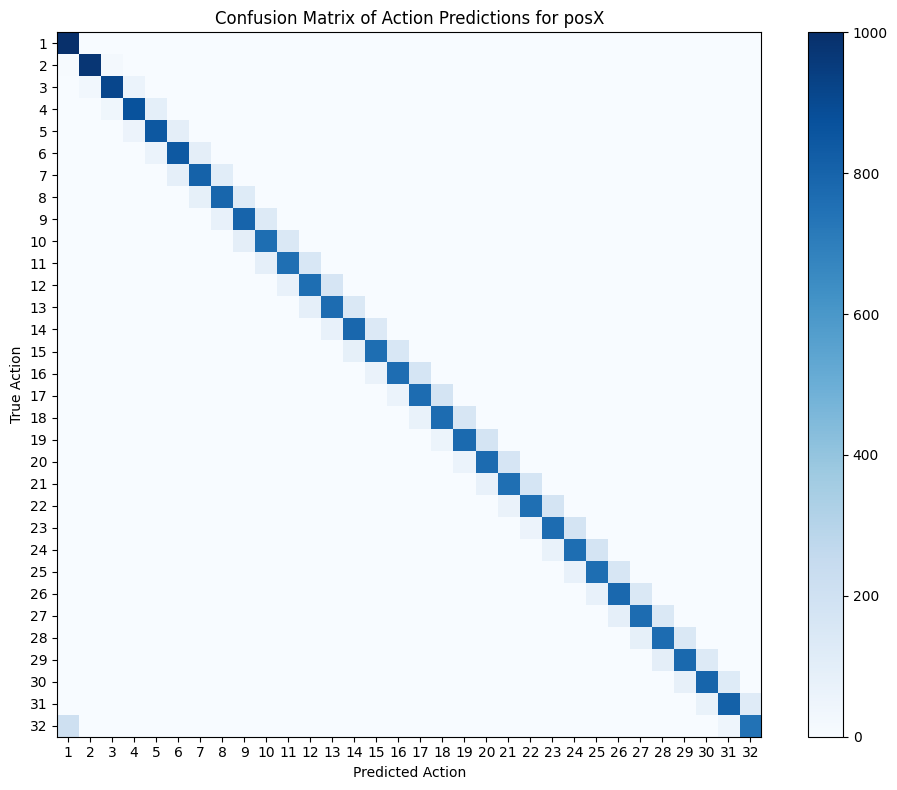

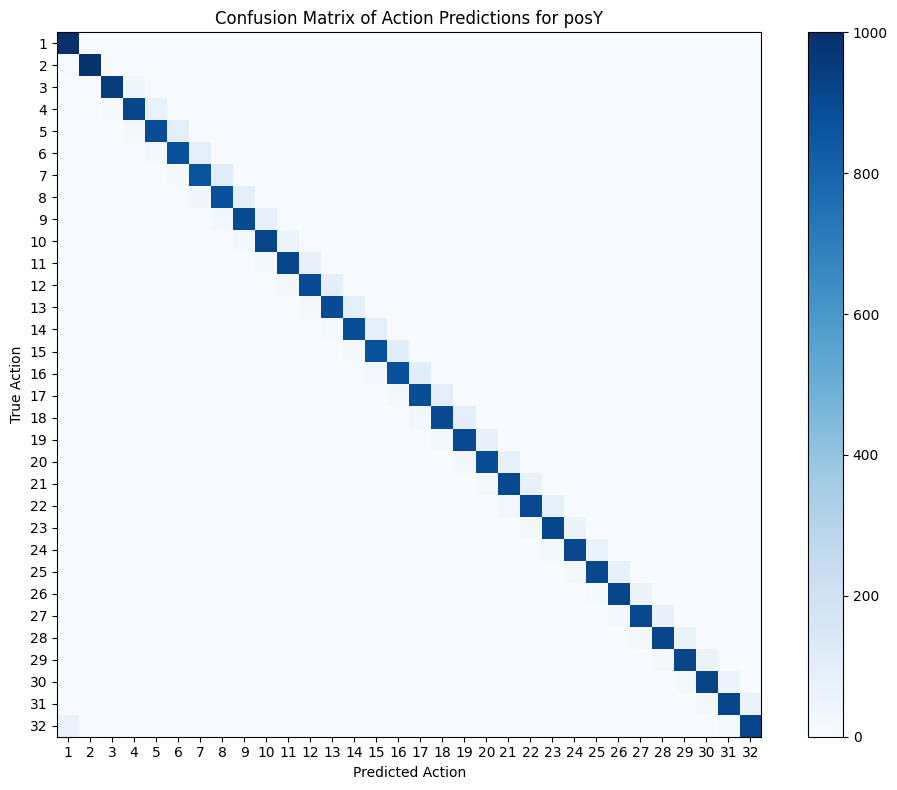

In [66]:
# Create a confusion matrix
import matplotlib.pyplot as plt
import numpy as np
for latent_name in val_dataset.latent_names:
    nn_predictor = NNActionPrediction(batch_size=10,
                                      epochs=100,
                                      seed=0,
                                      action_names=[[latent_name]])
    from groupcl.utils.jaxtyping import disable_jaxtyping
    with disable_jaxtyping():

        nn_results = nn_predictor.compute(
            solver=exp.solver,
            loader=exp.val_loader,
        )
    cm = nn_results["confusion_matrix"]
    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='none', cmap='Blues')
    plt.colorbar()
    plt.xticks(np.arange(cm.shape[1]), np.arange(1, cm.shape[1] + 1))
    plt.yticks(np.arange(cm.shape[0]), np.arange(1, cm.shape[0] + 1))
    plt.xlabel('Predicted Action')
    plt.ylabel('True Action')
    plt.title(
        f'Confusion Matrix of Action Predictions for {nn_predictor.action_names[0][0]}'
    )
    plt.tight_layout()
    plt.show()


array([[1000,    0,    0],
       [ 800,    7,  193],
       [ 829,    3,  168]])

{'confusion_matrix': array([[1000,    0,    0],
        [ 800,    7,  193],
        [ 829,    3,  168]]),
 'similarity_matrices': array([[-5.0246675e-11, -1.0765060e+02, -3.4653290e+01],
        [-9.7478104e+00, -1.0377845e+02, -3.7216003e+01],
        [-8.6924381e+00, -1.0408567e+02, -3.5535831e+01]], dtype=float32)}